In [3]:
using Pkg
Pkg.activate("../")
Pkg.status()
Pkg.instantiate()

      Status `~/Documents/comparison/ina-julia/Project.toml`
  [6e4b80f9] BenchmarkTools v1.1.4
  [a134a8b2] BlackBoxOptim v0.6.0
  [336ed68f] CSV v0.9.0
  [a93c6f00] DataFrames v1.2.2
  [0c46a032] DifferentialEquations v6.18.0
  [31c24e10] Distributions v0.24.18
  [a75be94c] GalacticOptim v2.0.3
  [7073ff75] IJulia v1.23.2
→ [c7f686f2] MCMCChains v4.14.1
  [429524aa] Optim v1.4.1
  [d96e819e] Parameters v0.12.2
  [91a5bcdd] Plots v1.21.3
  [438e738f] PyCall v1.92.3
  [efcf1570] Setfield v0.7.1
  [c3572dad] Sundials v4.5.3
  [bd369af6] Tables v1.5.1
→ [fce5fe82] Turing v0.17.4
        Info packages marked with → not downloaded, use `instantiate` to download


  Activating environment at `~/Documents/comparison/ina-julia/Project.toml`
   Installed FFTW_jll ──────────────── v3.3.9+8
   Installed MKL_jll ───────────────── v2021.1.1+1
   Installed NaturalSort ───────────── v1.0.0
   Installed AdvancedVI ────────────── v0.1.3
   Installed MCMCChains ────────────── v4.14.1
   Installed AdvancedHMC ───────────── v0.3.1
   Installed Functors ──────────────── v0.2.5
   Installed VectorizationBase ─────── v0.21.5
   Installed IntelOpenMP_jll ───────── v2018.0.3+2
   Installed WoodburyMatrices ──────── v0.5.3
   Installed InplaceOps ────────────── v0.3.0
   Installed FFTW ──────────────────── v1.4.3
   Installed EllipticalSliceSampling ─ v0.4.4
   Installed Tracker ───────────────── v0.2.16
   Installed MicroCollections ──────── v0.1.0
   Installed Polyester ─────────────── v0.4.4
   Installed Transducers ───────────── v0.4.65
   Installed ModelingToolkit ───────── v6.4.7
   Installed CompositionsBase ──────── v0.1.1
   Installed ChainRulesCore ──────

# Load packages

In [10]:
using DifferentialEquations
using Sundials
using DataFrames: DataFrame
using CSV: File as CSVFile

using Plots
using BenchmarkTools

using Parameters
using Setfield
using CPUTime
using LSODA

using BlackBoxOptim
using PyCall
so = pyimport("scipy.optimize");

In [4]:
import Pkg

# Load CSV

In [12]:
read_csv(filename) = DataFrame(CSVFile(filename))

read_csv (generic function with 1 method)

In [13]:
dirname_data = "../data"
dirname_legends = joinpath(dirname_data, "legends")
dirname_protocols = joinpath(dirname_data, "protocols")

filename_legend_constants = joinpath(dirname_legends, "legend_constants_v3.csv")
filename_legend_states = joinpath(dirname_legends, "legend_states.csv")
filename_protocol = joinpath(dirname_protocols, "protocol_sparse.csv");

In [14]:
legend_states = read_csv(filename_legend_states)
legend_constants = read_csv(filename_legend_constants)
protocol = read_csv(filename_protocol);

In [15]:
find_step(t, protocol) = protocol.v[findfirst(x -> x >= t, protocol.t)]

function create_p_from_legend(legend)
    name = Symbol.(legend_constants.name)
    value = legend_constants.value
    p = (; zip(name, value)...)
end

create_p_from_legend (generic function with 1 method)

# Load equations

In [16]:
include("../src/models/ina.jl");
include("../src/models/currents.jl");

# Define model

In [17]:
function compute_algebraic(du, u, p, t)
    
    v_comp, v_p, v_m, m, h, j, I_out = u
        
    tau_m  = calculate_tau_m(v_m, p)
    tau_h  = calculate_tau_h(v_m, p)
    tau_j  = calculate_tau_j(v_m, p)
    
    m_inf  = calculate_m_inf(v_m, p)
    h_inf  = calculate_h_inf(v_m, p)
    
    v_cp   = calculate_v_cp(v_comp, p)

    I_leak = 0 # calculate_I_leak(v_m, p)
    I_Na   = calculate_I_Na(v_m, m, h, j, p)
    I_c    = 0 # calculate_I_c(v_m, v_cp, I_leak, I_Na,  p)  # or calculate_I_c(v_m, v_p, I_leak, I_Na,  p)
    I_p    = 0  # or calculate_I_p(v_cp, v_p, p)
    I_comp = 0 # calculate_I_comp(v_comp, p)
    
    I_in   = I_leak + I_Na + I_c - I_comp + I_p
    
    a = (;
     tau_m, tau_h, tau_j, m_inf, h_inf,
     v_cp,
     I_leak, I_Na, I_c, I_comp, I_in
    )
    
end

compute_algebraic (generic function with 1 method)

In [18]:
function compute_rates!(du, u, p, t, safety_factor=1e-6)
    
    v_comp, v_p, v_m, m, h, j, I_out = u
    
    a = compute_algebraic(du, u, p, t)
    
    du[1] = calculate_d_v_comp(v_comp, p)  # v_comp
    
    @unpack v_cp, I_leak, I_Na = a
    du[2] = 0#calculate_d_v_p(v_cp, v_p, p)  # v_p
    du[3] = calculate_d_v_m(v_m, v_cp, I_leak, I_Na, p)  # v_m
        
    @unpack m_inf, tau_m, h_inf, tau_h, tau_j = a
    du[4] = calculate_d_gate(m_inf, m, tau_m + safety_factor)  # m
    du[5] = calculate_d_gate(h_inf, h, tau_h + safety_factor)  # h
    du[6] = calculate_d_gate(h_inf, j, tau_j)  # j
        
    @unpack I_in = a
    @unpack tau_z = p
    du[7] = calculate_d_gate(I_in, I_out, tau_z)  # I_out
    
    nothing
end

compute_rates! (generic function with 2 methods)

In [19]:
rhs = ODEFunction(compute_rates!, syms=[:v_comp, :v_p, :v_m, :m, :h, :j, :I_out]);

# Callbacks

In [20]:
function change_step_v1!(integrator)
    t = integrator.t
    v_c = find_step(t, protocol)
    integrator.p["v_c"] = v_c
    set_proposed_dt!(integrator, 1e-7)
    nothing
end

cb_step_v1  = PresetTimeCallback(protocol.t, change_step_v1!, save_positions=(false, false));

# Globals

In [21]:
u₀ = [-80.0, -80.0, -80.0, 0.0000001, 0.999999, 0.999999, 0.0];
reltol = 1e-3
abstol = [1e-3, 1e-3, 1e-3, 1e-6, 1e-6, 1e-6, 1e-3]
solver = CVODE_BDF(linear_solver=:BCG);
tspan_initial = (0., 10.)
tspan = (0., 5.)
dt = 1e-9
saveat = tspan[1]: 5e-5: tspan[2]

0.0:5.0e-5:5.0

# Loss

In [22]:
kwargs_loss_robust = (α=-2, c=0.1)

(α = -2, c = 0.1)

In [23]:
p_dict = Dict(zip(legend_constants.name, legend_constants.value));
p_dict["α"] = kwargs_loss_robust.α

-2

In [24]:
p_keys_opt_m = ["a0_m", "s_m", "b0_m", "delta_m", "v_half_m", "k_m"]
p_keys_opt_h = ["a0_h", "s_h", "b0_h", "delta_h", "v_half_h", "k_h"]
p_keys_opt_j = ["tau_j_const", "a0_j", "s_j", "b0_j", "delta_j"]

p_keys_opt_INa = ["g_max"]

p_keys_opt_other = ["α"]  # loss_robust
p_keys_opt_patch = ["c_p","c_m","R","R_f","g_leak","tau_z","x_c_comp","x_r_comp"]
p_keys_alpha = ["alpha"]

1-element Vector{String}:
 "alpha"

In [225]:
# p_keys_opt = vcat(p_keys_opt_m, p_keys_opt_h, p_keys_opt_j)
p_keys_opt = vcat(p_keys_opt_INa, p_keys_opt_other, p_keys_opt_m, p_keys_opt_h, p_keys_opt_j);#, p_keys_opt_patch, p_keys_alpha)

In [226]:
legend_subset = legend_constants[in(p_keys_opt).(legend_constants.name), :]

,name,value,bound_1,bound_2,is_log
,String1…,Float64,Float64,Float64,Int64
1,a0_m,16529.1,10000.0,100000.0,1
2,b0_m,386.7,100.0,1000.0,1
3,delta_m,22.823,1.0,100.0,0
4,s_m,12.8321,1.0,100.0,0
5,a0_h,6.26,1.0,100.0,1
6,b0_h,58131.4,10000.0,100000.0,1
7,delta_h,10.2758,1.0,100.0,0
8,s_h,21.62,1.0,100.0,0
9,a0_j,0.6462,0.01,1.0,1


In [27]:
mask_log = Dict(zip(legend_constants.name,
                    Array{Bool}(legend_constants.is_log)));
mask_log["α"] = Bool(0)

false

In [28]:
function calculate_loss_robust(x; α=2, c=1)
    if α ≈ 2
        loss = 0.5 * (x / 2)^2
    elseif α ≈ 0
        loss = log((x / c)^2 + 1)
#     elseif α > 1e9
#         loss = 1 - exp(-0.5 * (x / c)^2)
    else
        A = abs(α - 2) / α
        B = ((x / c)^2) / abs(α - 2) + 1
        loss = A * (B^(α / 2) - 1)
    end
end

calculate_loss_robust (generic function with 1 method)

In [30]:
function calculate_rmse(x, y)
    se = (x .- y) .^2
    return √mean(se)
end

calculate_rmse (generic function with 1 method)

In [31]:
function prepare_p(x::Vector{Float64})
    
    @assert length(x) == length(p_keys_opt)
    
    p = deepcopy(p_dict)
    for (k, v, is_log) in zip(p_keys_opt, x, mask_log)
        p[k] = mask_log[k] ? exp(v) : v
#         p[k] = v
    end
    
    p["α"] = kwargs_loss_robust.α
    
    return p
    
end

prepare_p (generic function with 1 method)

In [32]:
function solve_model(p)
    prob = ODEProblem(rhs, u₀, tspan, p, callback=cb_step_v1)
    #dtmax = 5e-5
    solve_kwargs = (; reltol, abstol, solver, saveat, dt)#max)
    sol = solve(prob; solve_kwargs...)
    return sol
end

solve_model (generic function with 1 method)

In [37]:
function sanity_check(p)
    v_m_range = -110:10:50
    tau_m = [calculate_tau_m(k, p) for k in v_m_range]
    tau_h = [calculate_tau_h(k, p) for k in v_m_range]
    tau_j = [calculate_tau_j(k, p) for k in v_m_range]
    
    tau_m_idxmax = findmax(tau_m)[2]
    tau_h_idxmax = findmax(tau_h)[2]
    tau_j_idxmax = findmax(tau_j)[2]

    is_ok = true
    is_ok &= all(1e-10 .< tau_m .< 0.001)
    is_ok &= all(1e-10 .< tau_h .< 0.01)
    is_ok &= all(1e-10 .< tau_j .< 1)
    
    is_ok &= (-100. < v_m_range[tau_m_idxmax] < -20.)
    is_ok &= (-100. < v_m_range[tau_h_idxmax] < -20.)
    is_ok &= (-100. < v_m_range[tau_j_idxmax] < -20.)
    
    return is_ok
end

sanity_check (generic function with 1 method)

In [38]:
function calculate_loss(x)
    
    p = prepare_p(x)
    if !sanity_check(p)
        return Inf
    end
    sol = solve_model(p)
    
    if sol.retcode ≠ :Success
        loss = Inf
    else
        #loss = calculate_rmse(sol[:I_out], data)
        residuals = sol[:I_out] - data
        loss = calculate_loss_robust.(residuals, α=p["α"], c=kwargs_loss_robust.c)
        loss = mean(loss)
    end
    return loss
    
end

calculate_loss (generic function with 1 method)





# Generate data

In [39]:
x₀ = [mask_log[k] ? log.(p_dict[k]) : p_dict[k] for k in p_keys_opt];

In [40]:
mask_log[p_keys_opt[1]] ? log.(p_dict[p_keys_opt[1]]) : p_dict[p_keys_opt[1]]

8.129292914487545

In [227]:
p = prepare_p(x₀);

In [42]:
sol = solve_model(p);

In [43]:
v_m_test = [k[3] - 18.0 for k in sol.u]
m_test = [k[4] for k in sol.u]
h_test = [k[5] for k in sol.u]
j_test = [k[6] for k in sol.u]
I_Na = [(p["g_max"]*(v_m_test[k] - p["v_rev"])*(m_test[k]^3)*h_test[k]*j_test[k]) for k in 1:length(m_test)];

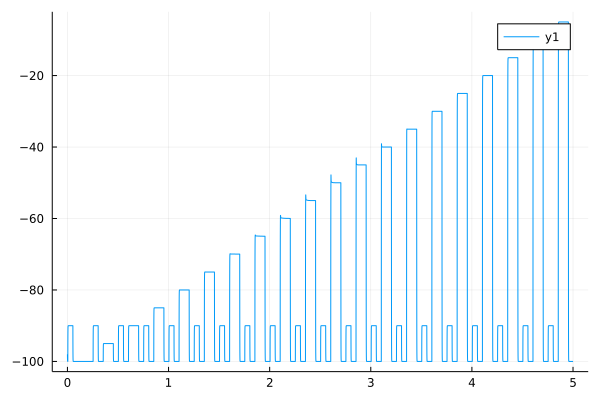

In [44]:
plot(sol.t,v_m_test)

In [45]:
data = copy(sol[:I_out]);

In [228]:
calculate_loss(x₀)

0.0

In [229]:
sanity_check(p)

true

# Test model

In [41]:
# remake(prob, p=p)

In [230]:
bounds = []

for key ∈ p_keys_opt
    if key == "α"
        append!(bounds, [(-5., 0.)])
        continue
    end
    idx = findfirst(legend_subset.name .== key)
    lb, ub = legend_subset.bound_1[idx], legend_subset.bound_2[idx]
    b = (lb, ub)
    if mask_log[key]
        b = map(x -> log.(x), b)
    end
    append!(bounds, [b])
end

In [231]:
x_initial = [b[1] + rand() * (b[2] - b[1]) for b in bounds];
p_initial = prepare_p(x_initial)

prob = ODEProblem(rhs, u₀, tspan, p_initial, callback=cb_step_v1)
solve_kwargs = (; reltol, abstol, solver)
sol = solve(prob; solve_kwargs...);


# Optimize

In [233]:
bounds = Vector{Tuple{Float64, Float64}}(bounds);

In [234]:
using BlackBoxOptim: num_func_evals

In [235]:
rhs = ODEFunction((du, u, p, t) -> compute_rates!(du, u, p, t, 0.0),#1e-6),
                  syms=[:v_comp, :v_p, :v_m, :m, :h, :j, :I_out]);

In [236]:
res = bboptimize(calculate_loss; SearchRange=bounds, MaxTime=1 * 60., TraceInterval=10,
                  PopulationSize=256,
                 );

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
10.11 secs, 617 evals, 414 steps, improv/step: 0.983 (last = 0.9831), fitness=0.299259803
20.41 secs, 1534 evals, 1269 steps, improv/step: 0.975 (last = 0.9708), fitness=0.298089525
30.53 secs, 2749 evals, 2473 steps, improv/step: 0.973 (last = 0.9718), fitness=0.297866643
40.91 secs, 3814 evals, 3534 steps, improv/step: 0.964 (last = 0.9416), fitness=0.284001066
51.11 secs, 4367 evals, 4084 steps, improv/step: 0.958 (last = 0.9200), fitness=0.284001066

Optimization stopped after 4783 steps and 60.15 seconds
Termination reason: Max time (60.0 s) reached
Steps per second = 79.51
Function evals per second = 84.22
Improvements/step = Inf
Total function evaluations = 5066


Best candidate found: [7.52829, -1.72108, 9.35158, 8.72253, 5.90332, 27.5363, 43.7888, 4.93361, 3.87153, 8.58859, 10

In [237]:
x_bbo = best_candidate(res);
x_best = copy(x_bbo);

In [238]:
res = so.minimize((x, args) -> calculate_loss(x), x_best, bounds,
                  method="Nelder-Mead", options=Dict(:maxiter => 100))

Dict{Any, Any} with 8 entries:
  "fun"           => 0.234051
  "nit"           => 100
  "nfev"          => 169
  "status"        => 2
  "success"       => false
  "message"       => "Maximum number of iterations has been exceeded."
  "x"             => [7.67576, -1.64702, 9.62133, 8.81808, 6.06727, 27.3742, 43…
  "final_simplex" => ([7.67576 -1.64702 … 8.71762 7.97793; 7.64958 -1.65481 … 8…

In [240]:
x_best = res["x"];

In [241]:
# res = so.minimize((x, args) -> calculate_loss(x), x_best, bounds, method="Nelder-Mead", options=Dict(:maxiter => 1000))

In [242]:
lb = [b[1] for b in bounds]
ub = [b[2] for b in bounds];

In [243]:
df = DataFrame(Name = p_keys_opt,
          True = x₀,
          Lb = lb,
          Best = x_best,
          Ub = ub);
# df[:, 2:end] = exp.(df[:, 2:end]);
df.relerr = (df.Best - df.True) ./ df.Best * 100.;

In [244]:
df

,Name,True,Lb,Best,Ub,relerr
,String,Float64,Float64,Float64,Float64,Float64
1,g_max,8.12929,6.90776,7.67576,9.21034,-5.90865
2,α,-2.0,-5.0,-1.64702,0.0,-21.4316
3,a0_m,9.71288,9.21034,9.62133,11.5129,-0.951471
4,s_m,12.8321,1.0,8.81808,100.0,-45.5203
5,b0_m,5.95765,4.60517,6.06727,6.90776,1.80671
6,delta_m,22.823,1.0,27.3742,100.0,16.626
7,v_half_m,28.358,10.0,43.4574,60.0,34.7453
8,k_m,7.66677,1.0,5.03787,10.0,-52.1828
9,a0_h,1.83418,0.0,3.838,4.60517,52.21


In [245]:
calculate_loss(x_bbo), calculate_loss(x_best)

(0.2840010655820772, 0.23405148319813138)

In [246]:
sol_best = solve_model(prepare_p(x_best));

In [247]:
plot(sol_best, vars=[:I_out])
plot!(sol_best.t .- 2e-2, data)
#plot!(ylims=(-5, 0.5))

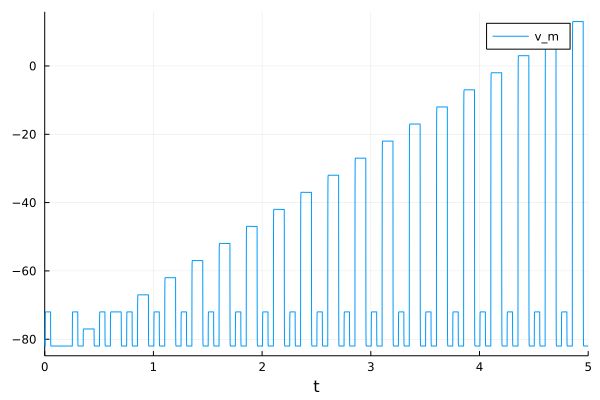

In [248]:
plot(sol_best, vars=[:v_m])

# Ionic characteristics

In [249]:
v_m = (-100:10)

-100:10

In [250]:
Tau_m  = [calculate_tau_m(k, p) for k in v_m]
Tau_h  = [calculate_tau_h(k, p) for k in v_m]
Tau_j  = [calculate_tau_j(k, p) for k in v_m]

M_inf  = [calculate_m_inf(k, p) for k in v_m]
H_inf  = [calculate_h_inf(k, p) for k in v_m];

In [251]:
p_best = prepare_p(x_best);

In [252]:
tau_m  = [calculate_tau_m(k, p_best) for k in v_m]
tau_h  = [calculate_tau_h(k, p_best) for k in v_m]
tau_j  = [calculate_tau_j(k, p_best) for k in v_m]

m_inf  = [calculate_m_inf(k, p_best) for k in v_m]
h_inf  = [calculate_h_inf(k, p_best) for k in v_m];

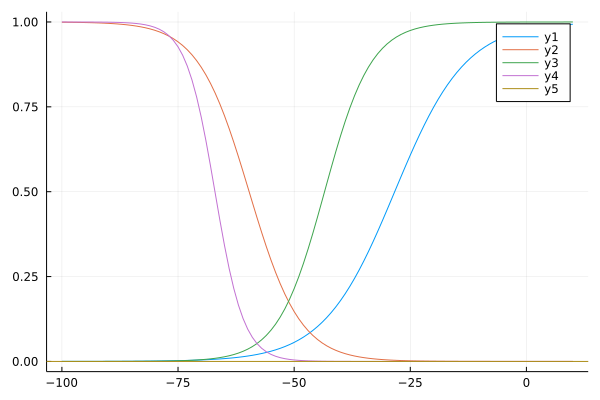

In [253]:
plot(v_m, M_inf)
plot!(v_m, H_inf)

plot!(v_m, m_inf)
plot!(v_m, h_inf)

hline!([0.])

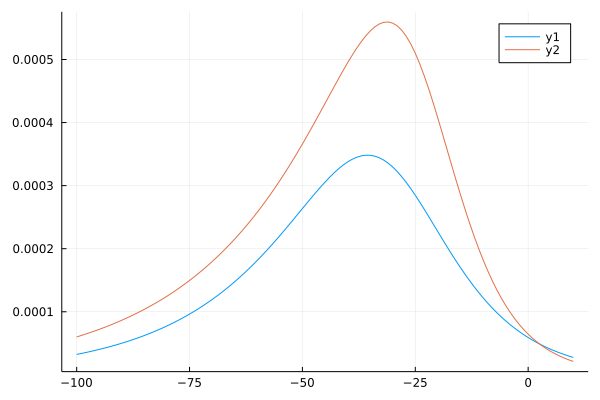

In [254]:
plot(v_m, Tau_m)
plot!(v_m, tau_m)

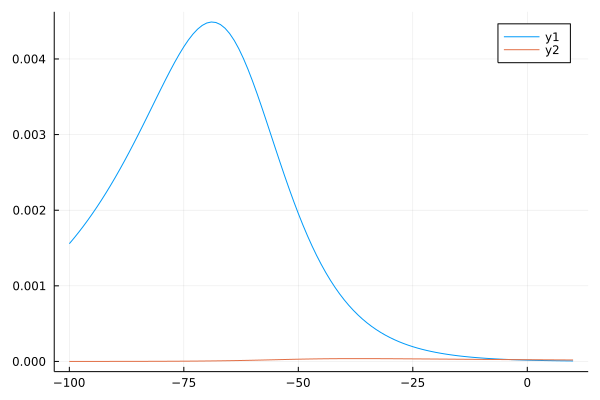

In [255]:
plot(v_m, Tau_h)
plot!(v_m, tau_h)

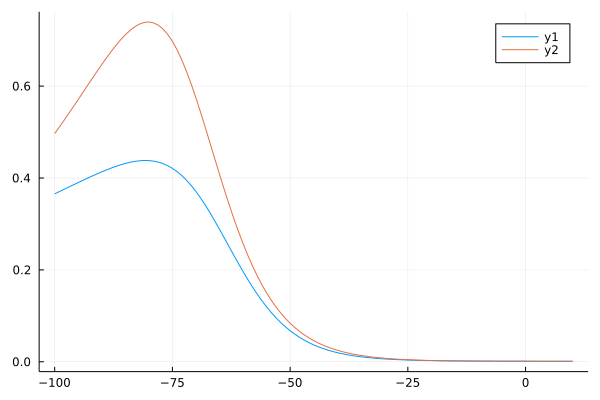

In [256]:
plot(v_m, Tau_j)
plot!(v_m, tau_j)

# Test unstable sol

In [163]:
x_initial = [b[1] + rand() * (b[2] - b[1]) for b in bounds];

In [316]:
st = :Success
p_rand = []

while st == :Success
    x_rand = [b[1] + rand() * (b[2] - b[1]) for b in bounds];

    p_rand = prepare_p(x_rand)
    if !sanity_check(p_rand)
        continue
    end
    #sol_best = solve_model(p_rand, )
    #st = sol_best.retcode
end

LoadError: InterruptException:

In [278]:
sol_best = solve_model(p_rand);

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/nik/.julia/packages/SciMLBase/UIp7W/src/integrator_interface.jl:351


In [279]:
sanity_check(p_rand)

true

In [280]:
function euler_step(u, du, dt)
    @. u + dt * du
end

euler_step (generic function with 1 method)

In [236]:
du = zeros(size(u₀))
t = 0.
dt = 2e-3

compute_rates!(du, u₀, p, t)

In [209]:
compute_algebraic(du, u₀, p, t)

(tau_m = 7.748704732773976e-5, tau_h = 0.0036043494359740084, tau_j = 0.4378998209398755, m_inf = 0.001186192662386021, h_inf = 0.9755722566332293, v_cp = -80.0, I_leak = 0, I_Na = -3.324545350899323e-16, I_c = 0, I_comp = 0, I_in = -3.324545350899323e-16)

In [231]:
integr = []
u_start = u₀
step = 1e-5
for k in 0.0: step:1
    u_continue = euler_step(u_start, du, step)
    u_start = u_continue
    append!(integr, [u_start])
end

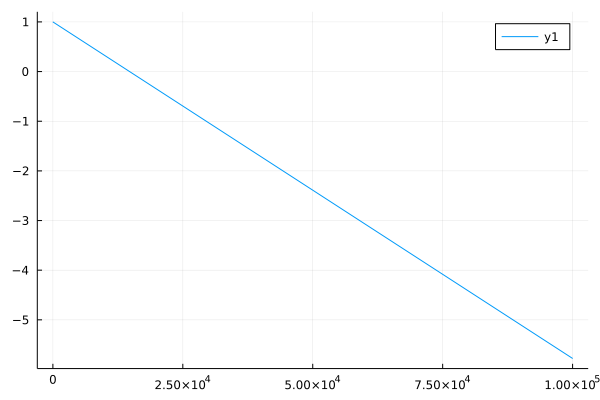

In [233]:
plot([k[5] for k in integr])

In [146]:
v_m_range = -200 : 100

tau_m = [calculate_tau_h(v_m, p_rand) for v_m in v_m_range]

Tau_m = [calculate_tau_h(v_m, p) for v_m in v_m_range];

In [197]:
m_inf = [calculate_m_inf(v_m, p_rand) for v_m in v_m_range]

M_inf = [calculate_m_inf(v_m, p) for v_m in v_m_range];

h_inf = [calculate_h_inf(v_m, p_rand) for v_m in v_m_range]

H_inf = [calculate_h_inf(v_m, p) for v_m in v_m_range];

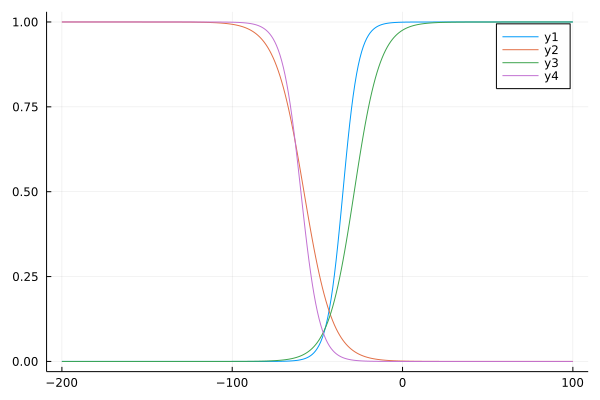

In [198]:
plot(v_m_range, m_inf)
plot!(v_m_range, h_inf)
plot!(v_m_range, M_inf)
plot!(v_m_range, H_inf)

# Monte Carlo

In [171]:
n_inside = 0
n_total = 100000
#p_list = []

for i in 1:n_total    
    x_rand = [b[1] + rand() * (b[2] - b[1]) for b in bounds]
    p_0 = prepare_p(x_rand)
    #append!(p_list, [p_0])
    n_inside += sanity_check(p_0)
end

In [173]:
(n_inside/n_total)*100

0.606

In [365]:
function try_solver(p_list, solver)
    solve_kwargs = (; reltol, abstol, solver, dtmax)
    for p in p_list
        prob = ODEProblem(rhs, u₀, tspan, p, callback=cb_step_v1)
        sol = solve(prob; solve_kwargs...)
    end
end
        


try_solver (generic function with 1 method)

In [346]:
@time @CPUtime try_solver(p_list, Rodas4())

elapsed CPU time: 5.246855 seconds
  5.356076 seconds (43.51 M allocations: 1.397 GiB, 12.04% gc time, 1.00% compilation time)


In [347]:
time_sum(p_list, solver) = @time @CPUtime try_solver(p_list, solver)

time_sum (generic function with 1 method)

In [367]:
solver_list = [Rosenbrock23(),TRBDF2(), ABDF2(), Rodas5(), Rodas4P(),Kvaerno5(), KenCarp4(), QNDF(),CVODE_BDF(), lsoda()]
solver_names = ["Rosenbrock23","TRBDF2", "ABDF2", "Rodas5", "Rodas4P","Kvaerno5", "KenCarp4",
        "QNDF","CVODE_BDF", "lsoda"]
times = []
for s in 1:length(solver_list)
    println(solver_names[s])
    time_sum(p_list, solver_list[s])
    println("\n")
    
end

Rosenbrock23
elapsed CPU time: 42.198563 seconds
 42.497693 seconds (434.62 M allocations: 13.943 GiB, 7.37% gc time)


TRBDF2
elapsed CPU time: 39.678046 seconds
 39.867608 seconds (434.62 M allocations: 13.943 GiB, 7.99% gc time)


ABDF2
elapsed CPU time: 39.175523 seconds
 39.296066 seconds (434.62 M allocations: 13.943 GiB, 7.93% gc time)


Rodas5
elapsed CPU time: 39.064403 seconds
 39.146536 seconds (434.62 M allocations: 13.943 GiB, 7.34% gc time)


Rodas4P
elapsed CPU time: 39.172721 seconds
 39.265423 seconds (434.62 M allocations: 13.943 GiB, 7.70% gc time)


Kvaerno5
elapsed CPU time: 39.166629 seconds
 39.237153 seconds (434.62 M allocations: 13.943 GiB, 7.92% gc time)


KenCarp4
elapsed CPU time: 38.842023 seconds
 39.290485 seconds (434.62 M allocations: 13.943 GiB, 7.75% gc time)


QNDF
elapsed CPU time: 38.793099 seconds
 39.008400 seconds (434.62 M allocations: 13.943 GiB, 7.44% gc time)


CVODE_BDF
elapsed CPU time: 39.701669 seconds
 39.823659 seconds (434.62 M alloc

# Using MPI

In [48]:
#    using IJulia
#    IJulia.installkernel("Julia 4 Threads", env=Dict(
#        "JULIA_NUM_THREADS" => "4",
#    ))


In [48]:
Threads.nthreads()
Threads.threadid()

1

In [49]:
Threads.@threads for i = 1:10
    println("i = $i on thread $(Threads.threadid())")
end

i = 4 on thread 2
i = 5 on thread 2
i = 9 on thread 4
i = 10 on thread 4
i = 1 on thread 1
i = 7 on thread 3
i = 8 on thread 3
i = 2 on thread 1
i = 3 on thread 1
i = 6 on thread 2


In [50]:
u₀ = [-80.0, -80.0, -80.0, 0.0000001, 0.999999, 0.999999, 0.0];
reltol = 1e-3
abstol = [1e-3, 1e-3, 1e-3, 1e-6, 1e-6, 1e-6, 1e-3]
solver = CVODE_BDF(linear_solver=:BCG);
tspan_trace = (0., 2.5)
dt = 1e-9
saveat = tspan[1]: 5e-5: tspan[2]

0.0:5.0e-5:5.0

In [51]:
function solve_model(p)
    prob = ODEProblem(rhs, u₀, tspan, p, callback=cb_step_v1)
    solve_kwargs = (; reltol, abstol, solver, saveat, dt)#max)
    sol = solve(prob; solve_kwargs...)
    return sol
end

solve_model (generic function with 1 method)

In [53]:
function solve_trace(p,tspan_trace)
    prob = ODEProblem(rhs, u₀, tspan_trace, p, callback=cb_step_v1)
    solve_kwargs = (; reltol, abstol, solver, saveat, dt)
    sol = solve(prob; solve_kwargs...)
    return sol
end

solve_trace (generic function with 1 method)

In [55]:
import Base.Threads.@spawn
using Distributed

In [57]:
function calculate_data(x)
    trace = zeros(100001)
    p = prepare_p(x)
    if !sanity_check(p)
        return Inf
    end
    tspan_trace = (0., 0.25)
    for k in 1:20
        t = tspan_trace .+0.25*(k-1)
        res = @spawn solve_trace(p, t)[:I_out]
        trace[(k-1)*5000+1: k*5000+1] += fetch(res)
    end
    return trace
    
end

calculate_data (generic function with 1 method)

In [203]:
function calculate_loss_test(x)
    p = prepare_p(x)
    if !sanity_check(p)
        return Inf
    end
    
    Res = Threads.Atomic{Float64}(0)
    tspan_trace = (0., 0.25)
    
    Threads.@threads for k in 1:20
        t = tspan_trace .+ 0.25*(k-1)
        dat = data[(k-1)*5000 + 1 : k*5000 + 1]
        sol = solve_trace(p, t)
        
        if sol.retcode ≠ :Success
            return Inf
        else
            residuals = sol[:I_out] - dat
            loss = sum(calculate_loss_robust.(residuals, α=p["α"], c=kwargs_loss_robust.c))
            Threads.atomic_add!(Res, loss)
        end     
    end
    return Res[]
end

calculate_loss_test (generic function with 1 method)

In [224]:
calculate_loss_test(x₀ .+ 1e-4)

36108.950653881766

In [220]:
calculate_loss(x₀ .+ 1e-4)

0.00013598231630635571

In [95]:
average_time_test(x₀) = @time @CPUtime calculate_loss_test(x₀);

In [132]:
@benchmark calculate_loss_test(x₀)

BenchmarkTools.Trial: 11 samples with 1 evaluation.
 Range (min … max):  323.462 ms … 635.260 ms  ┊ GC (min … max):  0.00% … 36.19%
 Time  (median):     510.423 ms               ┊ GC (median):    31.73%
 Time  (mean ± σ):   479.395 ms ± 110.951 ms  ┊ GC (mean ± σ):  23.48% ± 16.46%

  █  █ █          █        █          █     ██  █        █    █  
  █▁▁█▁█▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁██▁▁█▁▁▁▁▁▁▁▁█▁▁▁▁█ ▁
  323 ms           Histogram: frequency by time          635 ms <

 Memory estimate: 318.25 MiB, allocs estimate: 6102785.

In [130]:
@benchmark calculate_loss(x₀)

BenchmarkTools.Trial: 17 samples with 1 evaluation.
 Range (min … max):  283.643 ms … 330.873 ms  ┊ GC (min … max):  8.69% … 15.76%
 Time  (median):     312.239 ms               ┊ GC (median):    15.32%
 Time  (mean ± σ):   308.400 ms ±  16.945 ms  ┊ GC (mean ± σ):  12.57% ±  3.63%

  ███      █    █ █     ██            █    █   █  ██    █ █  ██  
  ███▁▁▁▁▁▁█▁▁▁▁█▁█▁▁▁▁▁██▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁█▁▁▁█▁▁██▁▁▁▁█▁█▁▁██ ▁
  284 ms           Histogram: frequency by time          331 ms <

 Memory estimate: 226.91 MiB, allocs estimate: 3297721.

In [382]:
plot(calculate_data(x₀))
plot!(data[1:100001])
plot!(xlims = (84010, 84551),
      ylims = (-0.2,0))